# Detecting Super Blooms Using Satellite Image Classification

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Introduction" data-toc-modified-id="Introduction-1">Introduction</a></span></li><li><span><a href="#Part-1.-Data-Preparation" data-toc-modified-id="Part-1.-Data-Preparation-2">Part 1. Data Preparation</a></span></li><li><span><a href="#Part-2.-Visualization-in-Natural-Color-with-DRA" data-toc-modified-id="Part-2.-Visualization-in-Natural-Color-with-DRA-3">Part 2. Visualization in Natural Color with DRA</a></span></li><li><span><a href="#Part-3.-Assess-Poppy-Blooms-Using-Pixel-Sampling-Techniques" data-toc-modified-id="Part-3.-Assess-Poppy-Blooms-Using-Pixel-Sampling-Techniques-4">Part 3. Assess Poppy Blooms Using Pixel Sampling Techniques</a></span><ul class="toc-item"><li><span><a href="#Section-3.1.-Spectral-Signature-of-California-Poppy" data-toc-modified-id="Section-3.1.-Spectral-Signature-of-California-Poppy-4.1">Section 3.1. Spectral Signature of California Poppy</a></span></li><li><span><a href="#Section-3.2.-Spectral-Angle-Mapper" data-toc-modified-id="Section-3.2.-Spectral-Angle-Mapper-4.2">Section 3.2. Spectral Angle Mapper</a></span></li><li><span><a href="#Section-3.3.-Point-Frame-Sampling-of-Pixels'-Spectral-Signatures" data-toc-modified-id="Section-3.3.-Point-Frame-Sampling-of-Pixels'-Spectral-Signatures-4.3">Section 3.3. Point-Frame Sampling of Pixels' Spectral Signatures</a></span><ul class="toc-item"><li><span><a href="#3.3.1.-About-Point-Frame-Sampling-Method" data-toc-modified-id="3.3.1.-About-Point-Frame-Sampling-Method-4.3.1">3.3.1. About Point-Frame Sampling Method</a></span></li><li><span><a href="#3.3.2.-Implementation-of-Point-Frame-Sampling" data-toc-modified-id="3.3.2.-Implementation-of-Point-Frame-Sampling-4.3.2">3.3.2. Implementation of Point-Frame Sampling</a></span></li></ul></li></ul></li><li><span><a href="#Part-4.-Vegetation-Health-or-Agriculture-Index" data-toc-modified-id="Part-4.-Vegetation-Health-or-Agriculture-Index-5">Part 4. Vegetation Health or Agriculture Index</a></span></li><li><span><a href="#Part-5.-Quantitative-Assessment-with-time-series-NDVI-imageries" data-toc-modified-id="Part-5.-Quantitative-Assessment-with-time-series-NDVI-imageries-6">Part 5. Quantitative Assessment with time-series NDVI imageries</a></span></li><li><span><a href="#Conclusion" data-toc-modified-id="Conclusion-7">Conclusion</a></span></li><li><span><a href="#References" data-toc-modified-id="References-8">References</a></span></li></ul></div>

## Introduction

The normally arid deserts in South California sprang into bright yellow, pink, and violet hues in year 2019, and attracted a huge crowd of visitors to the fields as to watch thousands of wildflowers open up. Such floral outbursts commonly occur after heavy rain falls on arid locales. For example, the unusually strong rains in Chile, 2015, caused the wildflowers to bloom in Atacama Desert.

The Walker Canyon fields of orange flowers had been mega popular for Spring 2019 (as shown in Fig 1), and attracted tens of thousands of visitors trying to see flowers and take selfies who then caused gridlock on Interstate 15 and city streets around the trailhead, and later Lake Elsinore officials temporarily closed the access due to this poppy apocalypse <a href='#References'>[1]</a>. 

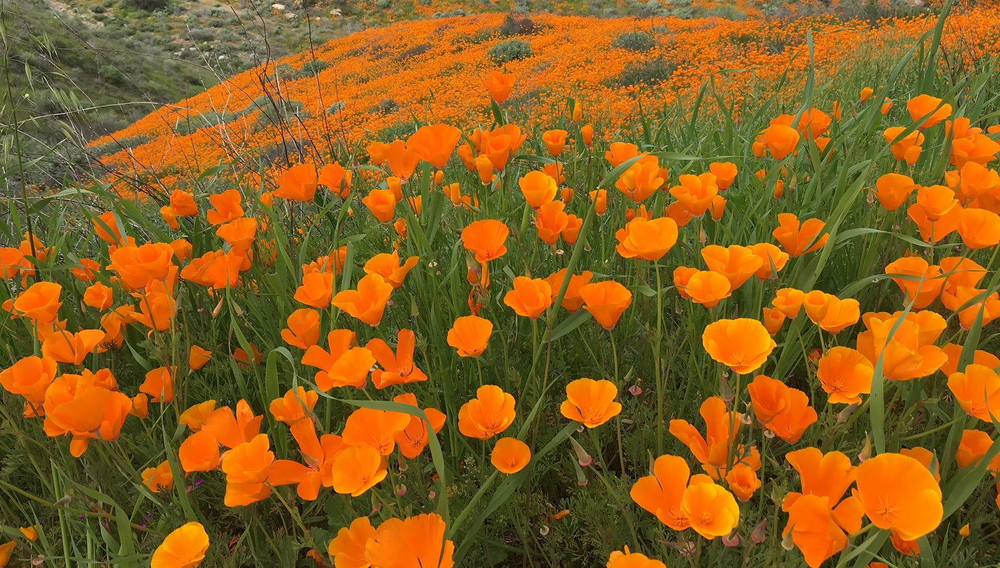
Fig 1. Photo of Poppy Blooming 2019 at Lake Elsinore, CA

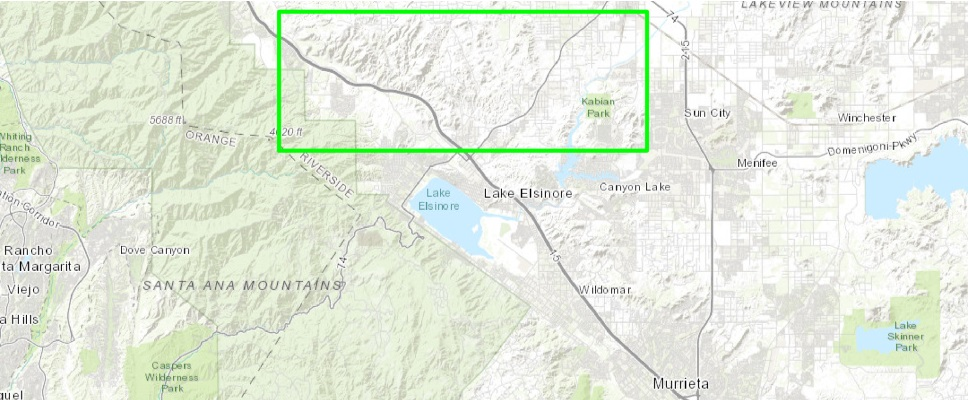
Fig 2. The map of selected site at Lake Elsinore

Lake Elsinore area (as mapped in Fig 2) is not the only place to find poppy blooms in Southern California - if only people are aware of several other poppy viewing spots before hand, such jams could be avoided. 

This sample is to study three poppy fields where people often go for watching super blooms, compare the sites with historic scenes, capture the differences in vegetation conditions, and calculate the vegetation density of blooms. In doing such, users can determine the occurrence of super blooms in the study area for a given year, and if so, how much of the vegetated area is involved. 

Pixel sampling methods such as Spectral Angle Mapper (SAM), and Point-Frame Sampling, are used in the implementation of this sample. Alternatively, methods like [Maximum Likelihood Classification](https://pro.arcgis.com/en/pro-app/tool-reference/spatial-analyst/how-maximum-likelihood-classification-works.htm), or [Pixel-based Image classification provided by arcgis.learn](https://developers.arcgis.com/python/guide/pixel-based-classification) can also be used to solve the issue (which are not covered here), and in that case, the sampling methods introduced here could be applied as validation measures. Please refer to the above mentioned links if interested.

## Part 1. Data Preparation

First, import all required packages or modules:

In [1]:
import arcgis
from arcgis import geometry
from arcgis.geometry import Geometry
from arcgis.gis import GIS
from arcgis.geocoding import geocode
from arcgis.raster.functions import stretch, extract_band, apply, composite_band, colormap, remap, ndvi, NDVI
import pandas as pd
import datetime as dt
import sys
import math
import numpy as np
from bokeh.models import Range1d
from bokeh.plotting import figure, show, output_notebook
from IPython.display import clear_output, HTML
from ipywidgets import *
import matplotlib.pyplot as plt

Choose ArcGIS Online organization as your `GIS` instance to access remote sensing imageries, and then also use it as the destination `GIS` instance to visualize and save the map, e.g. `gis = GIS('https://www.arcgis.com',"<your username>","<your password>")` or via existing profile.

In [ ]:
gis = GIS('home')

In this sample, the satellite imageries used are sourced from Sentinel-2 product, which is 10m Multispectral 13-band imagery, rendered on-the-fly. `Esri Living Atlas` has it available for visualization and analytics, that pulls directly from the Sentinel-2 on AWS collection and updates daily with new imagery. Also, this imagery layer can be used for multiple purposes including but not limited to vegetation, deforestation, climate change, land cover and environmental monitoring.

<Item title:"Sentinel-2 Views" type:Imagery Layer owner:esri>
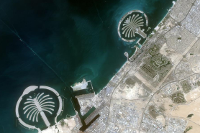

In [3]:
def exact_search(my_gis, title, owner_value, item_type_value):
    final_match = None
    search_result = my_gis.content.search(query= title + ' AND owner:' + owner_value, item_type=item_type_value, outside_org=True)
    
    if "Imagery Layer" in item_type_value:
        item_type_value = item_type_value.replace("Imagery Layer", "Image Service")
    elif "Layer" in item_type_value:
        item_type_value = item_type_value.replace("Layer", "Service")
    
    for result in search_result:
        if result.title == title and result.type == item_type_value:
            final_match = result
            break
    return final_match

landsat_item = exact_search(gis, 'Sentinel-2 Views', 'esri', 'Imagery Layer')
landsat = landsat_item.layers[0]
landsat_item

Three study sites have been selected for the purpose: (1) Carrizo Plain, (2) Lake Elsinore, and (3) Anza-Borrego Desert, and their locations have been hand-picked from the map and represented in coordinates. Details are as follows:

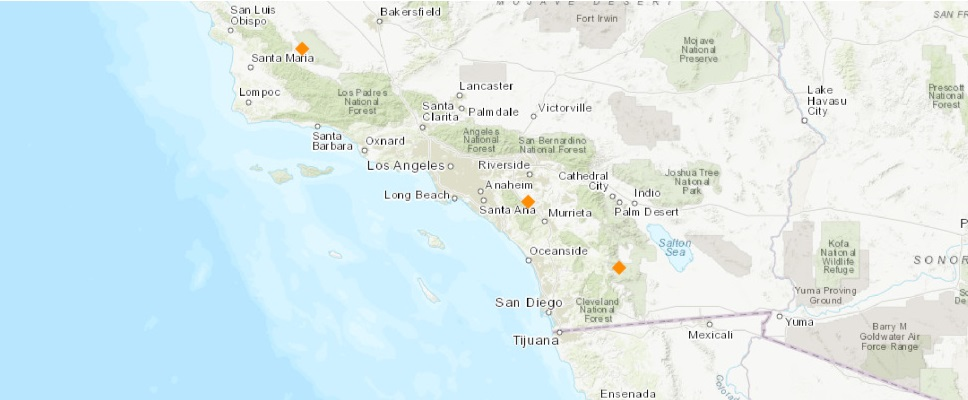

site #1 (shown as the leftmost site)
```python
address = 'Carrizo Plain National Monument'
location = [35.116773, -119.868223]
```

site #2
```python
address = 'Lake Elsinore, Riverside County, CA'
location = [33.731534, -117.392019]
```

site #3 (shown as the rightmost site)
```python
address = 'Anza-Borrego Desert State Park'
location = [33.124406, -116.394491] # Anza-Borrego Desert State Park
```

## Part 2. Visualization in Natural Color with DRA

Default rendering of the Sentinel-2 Imagery Layer is Natural Color (bands 4,3,2) with DRA, which is a combination of bands red, green, blue displayed with dynamic range adjustment applied. This DRA version enables visualization of the full dynamic range of the images, while the non-DRA version of this layer can be viewed by switching to the pre-defined Natural Color raster function. Now let's visualize the site #1 (located at 'Carrizo Plain National Monument') with Natural Color (DRA) bands, and compare across years.

In [4]:
no_of_days = 16

address = 'Carrizo Plain National Monument'
location = {'x': -13344469.586662592,
            'y': 4177701.2953077466,
            'spatialReference': {'latestWkid': 3857, 'wkid': 102100}}

In [5]:
# use geocode(...) to have the address geocoded, and return a feature set or a dict 
area = geocode(address, out_sr=landsat.properties.spatialReference)[0]

> **Note**: Any Sentinel-2 image available on [Living Atlas](https://geosaurus.maps.arcgis.com/home/item.html?id=fd61b9e0c69c4e14bebd50a9a968348c), within the past 14 months, can be displayed via image selection or custom filtering. However, for images beyond the provided temporal coverage (past 14 months), the `call_filter_images` method defined below will return an empty list signifying no matched image tiles found in online archive. In this case, we will need to use `SentinelHub` API to download the sentinel-2 images directly, and render/analyze from local memory. At the encounter of missing tiles from sentinel-2 imagery layer, please refer to `Part 2.b. Downloading & Visualization via SentinelHub API` for the use of SentinelHub API.

### Part 2.a. Visualization via Sentinel-2 Imagery Layer

In the `filter_images` method defined below, given the temporal range and the spatial boundingbox of the FeatureClass, `filter_by(...)` is performed to the imagery layer with the criteria, and when one or more mosaic tiles meet the requirements, get the `blend` of these tiles and add to current map.

The method `call_filter_images` basically serves as a wrapper that defines the starting and ending date/time of the satellite images to be queried, and then calls `filter_images` with the parsed arguments.

In [6]:
def filter_images(my_map, start_datetime, end_datetime, extent=area['extent']):
    
    geom_obj = Geometry(extent)
    selected = landsat.filter_by(where="(Category = 1) AND (CloudCover <=0.025)",
                                 time=[start_datetime, end_datetime],
                                 geometry=geometry.filters.intersects(geom_obj))
    
    id_list = selected.filtered_rasters()
    print("Applicable lockRasterIds=", id_list)
    
    if not id_list:
        # when id_list is empty
        return None
    else:
        # when id_list at least has one element
        date_title_from = start_datetime.strftime("%m/%d/%Y")
        date_title_to = end_datetime.strftime("%m/%d/%Y")
        my_map.content.add(selected.blend(), {"title": date_title_from + " to " + date_title_to + " at " + address})

        fs = selected.query(out_fields="AcquisitionDate, name, CloudCover")
        tdf = fs.sdf  
        
        return [tdf, selected]

In [7]:
def call_filter_images(my_map, date_str, extent = area['extent']):
    datetime_object = dt.datetime.strptime(date_str, '%Y-%m-%d')
    start_datetime = datetime_object - dt.timedelta(days=no_of_days)
    end_datetime = datetime_object + dt.timedelta(days=no_of_days + 1)
    [tdf, selected] = filter_images(my_map, start_datetime, end_datetime, extent = area['extent'])
    if tdf is not None:
        display(tdf.head())
    return selected

Visualizations of the Natural Color bands at the same site across different times would give viewers the most straight-forward impressions for the vegetation coverage differences. For example, here we will see three maps for site #1 in March 2019, Sep 2018, and March 2018, respetively.

**Firstly**, let's take a look at the site #1 in Spring 2019.

MapView(layout=Layout(height='400px', width='100%'), zoom=12.0)


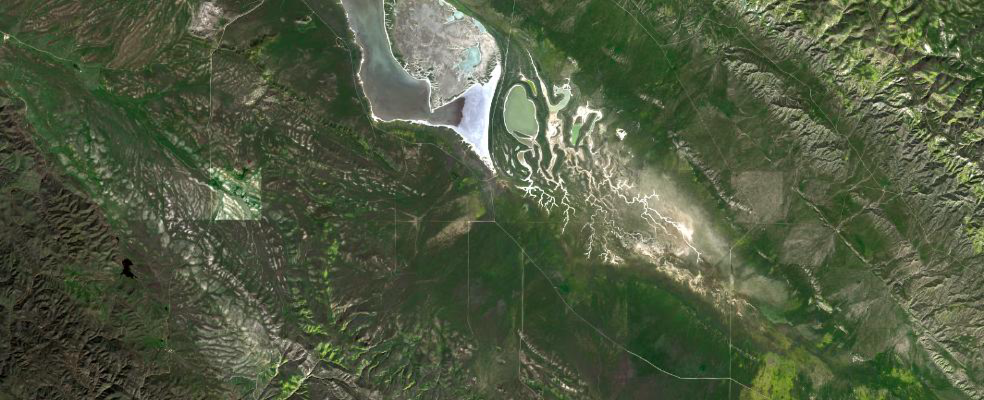

In [7]:
map1 = gis.map(address, zoomlevel = 12)
map1.center = location 
map1

In [8]:
map1_selected = call_filter_images(map1, "2019-03-18")
img_src = map1_selected

Applicable lockRasterIds= [6084205, 6153267, 6270450, 6270453, 6319626, 6319629, 6319630, 6445827]


,SHAPE,acquisitiondate,cloudcover,name,objectid,shape_Area,shape_Length
0,"{""rings"": [[[-13257110.9355, 4182793.701999999...",2019-03-18 19:05:08,0.0000,20190318T190508_11SKV_0,6084205,1.810900e+10,538285.191379
1,"{""rings"": [[[-13257110.9355, 4182793.701999999...",2019-04-07 19:05:36,0.0005,20190407T190536_11SKV_0,6270453,1.810900e+10,538285.191379
2,"{""rings"": [[[-13309623.2423, 4313473.204899996...",2019-03-18 18:56:52,0.0000,20190318T185652_10SGE_0,6153267,1.810571e+10,538236.250417
3,"{""rings"": [[[-13309623.2423, 4313473.204899996...",2019-04-07 18:57:17,0.0000,20190407T185717_10SGE_0,6270450,1.810571e+10,538236.250417
4,"{""rings"": [[[-13309623.2423, 4313473.204899996...",2019-04-17 19:03:17,0.0000,20190417T190316_10SGE_0,6319630,1.810571e+10,538236.250417


**Secondly**, if compared to Autumn 2018, 

MapView(layout=Layout(height='400px', width='100%'), zoom=12.0)


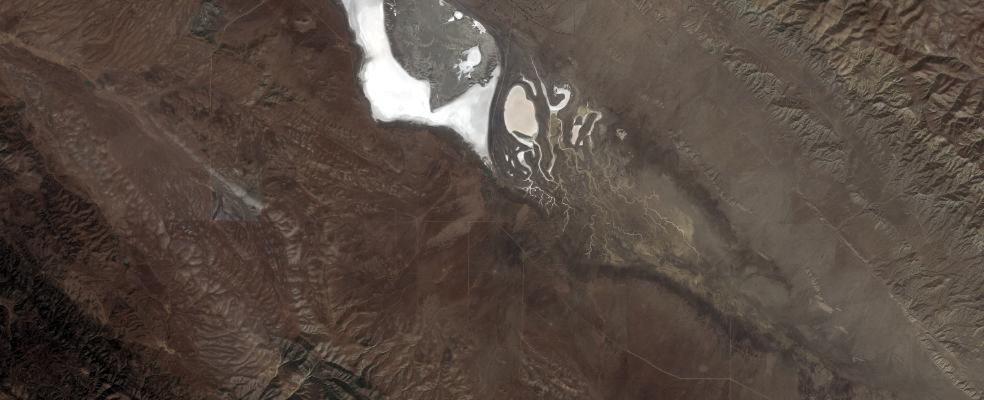

In [9]:
map2 = gis.map(address, zoomlevel = 12)
map2.center = location
map2

In [10]:
map2_selected = call_filter_images(map2, "2018-09-19")
img_src = map2_selected

Applicable lockRasterIds= [3505372, 3571325, 3616157, 3616161, 3660645, 3660646, 3660649, 3660650, 4118255, 4118256, 4289317, 4333564, 4333568, 4333569, 4399279, 4399280, 4437535, 4492416, 6023347, 6023365]


,SHAPE,acquisitiondate,cloudcover,name,objectid,shape_Area,shape_Length
0,"{""rings"": [[[-13257110.9355, 4182793.701999999...",2018-08-25 18:44:31,0.0007,20180825T184430_11SKV_0,3505372,1.810900e+10,538285.191379
1,"{""rings"": [[[-13257110.9355, 4182793.701999999...",2018-09-04 18:52:52,0.0008,20180904T185252_11SKV_0,3571325,1.810900e+10,538285.191379
2,"{""rings"": [[[-13309623.2423, 4313473.204899996...",2018-09-19 18:50:20,0.0010,20180919T185019_10SGE_0,4118255,1.810571e+10,538236.250417
3,"{""rings"": [[[-13257110.9355, 4182793.701999999...",2018-10-09 18:46:56,0.0024,20181009T184656_11SKV_0,4289317,1.810900e+10,538285.191379
4,"{""rings"": [[[-13257110.9355, 4182793.701999999...",2018-10-19 18:51:03,0.0016,20181019T185102_11SKV_0,4399280,1.810900e+10,538285.191379


The differences of map1 and map2 might be largely due to the seasonal changes of growing conditions for vegetation. When comparing the same site at the same growing phase of vegetation across years, e.g. that of Spring 2019 VS. Spring 2018, the scale differences for poppy bloomings are more significant.

**Thirdly**, Natural Color (with DRA) bands overlayed on top of the site #1 for Spring 2018.

MapView(layout=Layout(height='400px', width='100%'), zoom=12.0)


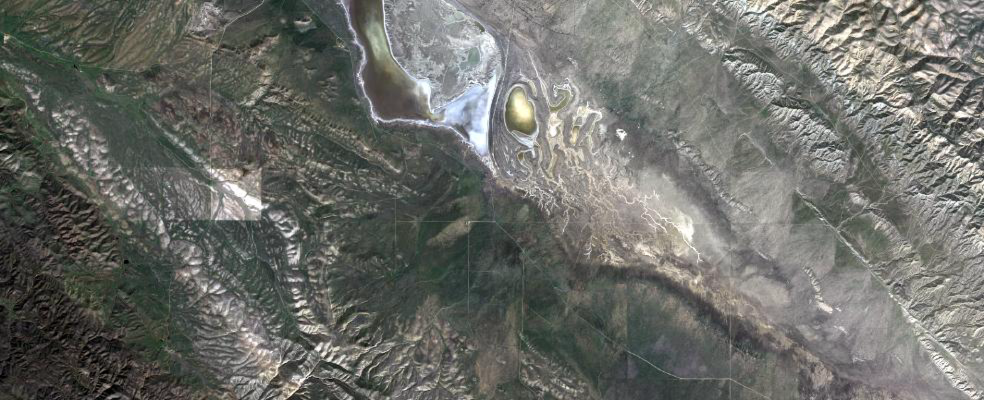

In [11]:
map3 = gis.map(address, zoomlevel = 12)
map3.center = location
map3

In [12]:
map3_selected = call_filter_images(map3, "2018-03-08")
img_src = map3_selected

Applicable lockRasterIds= [1972655, 1972673, 1972674]


,SHAPE,acquisitiondate,cloudcover,name,objectid,shape_Area,shape_Length
0,"{""rings"": [[[-13313900.2247, 4190154.183799997...",2018-03-28 18:43:57,0.0005,20180328T221051_10SGD_0,1972655,1.771076e+10,532333.167074
1,"{""rings"": [[[-13254604.057599999, 4060764.0938...",2018-03-28 18:43:57,0.0000,20180328T221051_11SKU_0,1972673,1.771391e+10,532380.526279
2,"{""rings"": [[[-13257110.9355, 4182793.701999999...",2018-03-28 18:43:57,0.0000,20180328T221051_11SKV_0,1972674,1.810900e+10,538285.191379


To help visualize the differences between these three time ranges better, we will use `side_by_side` method to demonstrate the three derived maps side by side here.

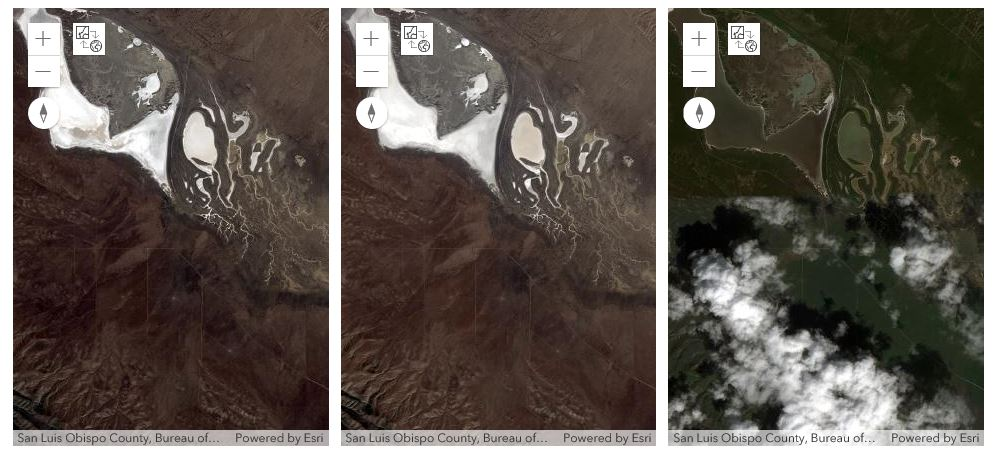

In [1]:
def side_by_side(map3, map2, map1):
    map1.layout=Layout(flex='1 1', padding='6px', height='450px')
    map2.layout=Layout(flex='1 1', padding='6px', height='450px')
    map3.layout=Layout(flex='1 1', padding='6px', height='450px')

    box = HBox([map3, map2, map1])
    return box

side_by_side(map3, map2, map1)

From the satellite imageries of map3 (Spring 2018), map2 (Autumn 2018), and map1 (Spring 2019), from left to right, we can see the different intensities of vegetation coverage in the same area (site #1). However, simply visualizing the area across years does not provide quantitative information of how the poppy fields expand or shrink. Parts 3 and 5 will show more information about quantifying vegetation growth.

### Part 2.b. Downloading & Visualization via SentinelHub API

At the encounter of missing tiles from accessing sentinel-2 imagery layer in `Living Atlas`, please run the following cells to utitlize `SentinelHub` API, in downloading and rendering the sentinel-2 data from [Sentinel Hub](https://dataspace.copernicus.eu/analyse/apis/sentinel-hub) directly. Let's start by installing the SentinelHub library.
```
!pip install --upgrade typing_extensions

!pip install --upgrade pydantic # if pydantic present in current env

!pip install sentinelhub
```

Downloading Sentinel-2 data via the API requires Sentinel Hub account. Please check [configuration instructions](https://sentinelhub-py.readthedocs.io/en/latest/configure.html) and [webinar](https://www.youtube.com/watch?v=CBIlTOl2po4&t=1760s) about how to set up your Sentinel Hub credentials.

Once credentials have been granted on [dashboard](https://apps.sentinel-hub.com/dashboard/#/account/settings), we can then specify the log-in information in the configuration file, as shown below:

In [7]:
from sentinelhub import SHConfig

config = SHConfig()
#config.instance_id = "my-instance-id"
#config.sh_client_id='<your client id>'
#config.sh_client_secret='<your secret token>'
config.save("my-profile")

if not config.sh_client_id or not config.sh_client_secret:
    print("Warning! To use Process API, please provide the credentials (OAuth client ID and client secret).")

#### Imports

In [8]:
import datetime
import os
import matplotlib.pyplot as plt
import numpy as np

from sentinelhub import (
    CRS,
    BBox,
    DataCollection,
    DownloadRequest,
    MimeType,
    MosaickingOrder,
    SentinelHubDownloadClient,
    SentinelHubRequest,
    bbox_to_dimensions,
)

#### Setting area of interest

We will download Sentinel-2 imagery of 'Carrizo Plain National Monument' such as the images shown in Part 2.a. (taken by Sentinel-2 on 2019-03-18):

In [1]:
geocode(address, out_sr=4326)[0]['extent']

{'xmin': -120.1389, 'ymin': 34.91945, 'xmax': -119.5749, 'ymax': 35.48345}


In [9]:
area_coords_wgs84 = (-120.1389, 34.91945, -119.5749, 35.48345)

The bounding box in WGS84 coordinate system is [-120.1389, 34.91945, -119.5749, 35.48345] (longitude and latitude coordinates of lower left and upper right corners), which we can obtain via `geocode` specifying the output spatial reference.

All requests require bounding box to be given as an instance of `sentinelhub.geometry.BBox` with corresponding Coordinate Reference System (`sentinelhub.constants.CRS`). In our case it is in WGS84 and we can use the predefined WGS84 coordinate reference system from `sentinelhub.constants.CRS`.

When the bounding box bounds have been defined, you can initialize the BBox of the area of interest. Using the `bbox_to_dimensions` utility function, we can provide the desired resolution parameter of the image in meters and obtain the output image shape. For more, please refer to the official document from [SentinelHub](https://sentinelhub-py.readthedocs.io/en/latest/examples/process_request.html).

In [10]:
resolution = 60
area_bbox = BBox(bbox=area_coords_wgs84, crs=CRS.WGS84)
area_size = bbox_to_dimensions(area_bbox, resolution=resolution)

print(f"Image shape at {resolution} m resolution: {area_size} pixels")

Image shape at 60 m resolution: (886, 1018) pixels


#### True color mosaic of least cloudy acquisitions

We can build the request according to the [API Reference](https://docs.sentinel-hub.com/api/latest/reference/), using the `SentinelHubRequest` class. Each Process API request also needs an `evalscript`.

The information that we specify in the `SentinelHubRequest` object is:

 - an evalscript,
 - a list of input data collections with time interval,
 - a format of the response,
 - a bounding box and it’s size (size or resolution).

The `evalscript` in the example is used to select the appropriate bands, and returns the RGB (B04, B03, B02) Sentinel-2 L1C bands. The image from March 18th, 2019 is downloaded. Without any additional parameters in the evalscript, the downloaded data will correspond to reflectance values in UINT8 format (values in 0-255 range).

The `SentinelHubRequest` automatically creates a mosaic from all available images in the given time interval. By default, the mostRecent mosaicking order is used. More information available [here](https://docs.sentinel-hub.com/api/latest/#/data/Sentinel-2-L2A?id=mosaickingorder).

In this example we are querying for a 12-day long interval, order the images w.r.t. the cloud coverage on the tile level (`leastCC` parameter), and mosaic them in the specified order.

In [11]:
evalscript_true_color = """
    //VERSION=3

    function setup() {
        return {
            input: [{
                bands: ["B02", "B03", "B04"]
            }],
            output: {
                bands: 3
            }
        };
    }

    function evaluatePixel(sample) {
        return [sample.B04, sample.B03, sample.B02];
    }
"""

request_true_color = SentinelHubRequest(
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L1C,
            time_interval=("2019-03-12", "2019-03-24"),
            mosaicking_order=MosaickingOrder.LEAST_CC,
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
    bbox=area_bbox,
    size=area_size,
    config=config,
)

The method `get_data()` will always return a list of length 1 with the available image from the requested time interval in the form of numpy arrays.

In [12]:
downloaded = request_true_color.get_data()
print(len(downloaded))

1


In [14]:
"""
Utilities defined in SentinelHub repo (https://github.com/sentinel-hub/sentinelhub-py/blob/master/)
"""
from typing import Any, Optional, Tuple

import matplotlib.pyplot as plt
import numpy as np


def plot_image(
    image: np.ndarray, factor: float = 1.0, clip_range: Optional[Tuple[float, float]] = None, **kwargs: Any
) -> None:
    """Utility function for plotting RGB images."""
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15))
    if clip_range is not None:
        ax.imshow(np.clip(image * factor, *clip_range), **kwargs)
    else:
        ax.imshow(image * factor, **kwargs)
    ax.set_xticks([])
    ax.set_yticks([])

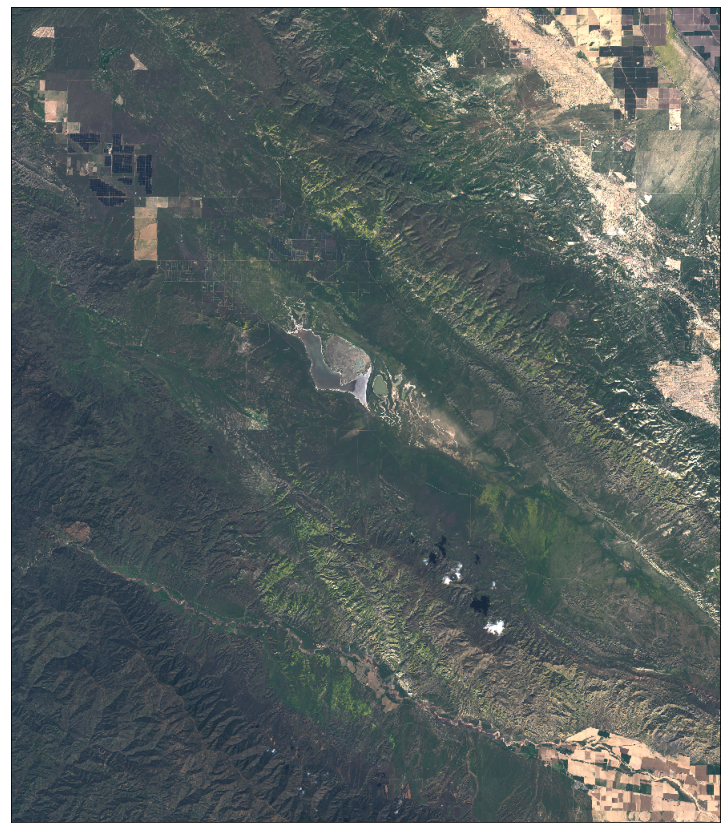

In [15]:
plot_image(downloaded[0], factor=3.5 / 255, clip_range=(0, 1))

#### Multiple timestamps data

Now let's construct some logic in order to return data for multiple timestamps. By defining the `time_interval` parameter and some logic of splitting it, it is possible to create an `SentinelHub` request per each "time slot" and then download the data from all the requests with the `SentinelHubDownloadClient` in `sentinelhub-py`. In this following, we will create least cloudy monthly images for the specified time slots in years 2018-2020.

In [30]:
slots = [("2018-03-22", "2018-04-03"),
         ("2018-09-13", "2018-09-25"),
         ('2019-03-12', '2019-03-24'),
         ("2019-09-13", "2019-09-25"),
         ("2020-03-22", "2020-04-03"),
         ("2020-09-13", "2020-09-25")]

In [31]:
def get_true_color_request(time_interval):
    return SentinelHubRequest(
        evalscript=evalscript_true_color,
        input_data=[
            SentinelHubRequest.input_data(
                data_collection=DataCollection.SENTINEL2_L1C,
                time_interval=time_interval,
                mosaicking_order=MosaickingOrder.LEAST_CC,
            )
        ],
        responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
        bbox=area_bbox,
        size=area_size,
        config=config,
    )

In [32]:
# create a list of requests
list_of_requests = [get_true_color_request(slot) for slot in slots]
list_of_requests = [request.download_list[0] for request in list_of_requests]

# download data with multiple threads
data = SentinelHubDownloadClient(config=config).download(list_of_requests, max_threads=5)

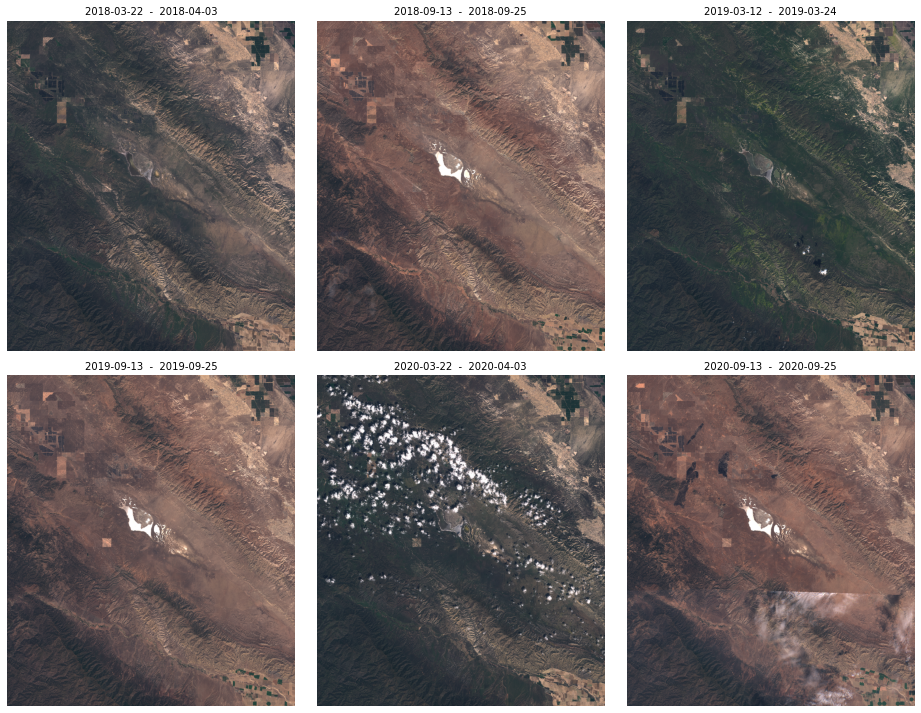

In [34]:
# some stuff for pretty plots
ncols = 3
nrows = 2
aspect_ratio = area_size[0] / area_size[1]
subplot_kw = {"xticks": [], "yticks": [], "frame_on": False}

fig, axs = plt.subplots(ncols=ncols, nrows=nrows, figsize=(5 * ncols * aspect_ratio, 5 * nrows), subplot_kw=subplot_kw)

for idx, image in enumerate(data):
    ax = axs[idx // ncols][idx % ncols]
    ax.imshow(np.clip(image * 2.5 / 255, 0, 1))
    ax.set_title(f"{slots[idx][0]}  -  {slots[idx][1]}", fontsize=10)

plt.tight_layout()

## Part 3. Assess Poppy Blooms Using Pixel Sampling Techniques

Simply cross comparing the same site between years is not sufficient to provide for quantitative analysis of the growing conditions of poppy fields. Learning the spectral signature of California Poppy can be the first step in identifying and classifying poppy fields apart from other vegetation, and monitor its growing conditions. To begin with, we will study the spectral signature of poppy fields sampled from site #2 (located at Lake Elsinore, CA).

In [8]:
address = 'Lake Elsinore, Riverside County, CA'
location = [33.731534, -117.392019]
extent = {
         'spatialReference': {'latestWkid': 3857, 'wkid': 102100},
         'xmin': -13069423.352856144,
         'ymin': 3992554.729402538,
         'xmax': -13064722.475616481,
         'ymax': 3994465.655109718}

### Section 3.1. Spectral Signature of California Poppy

Since Sentinel is a 10m Multispectral 13-band imagery product, having the pixel values of the sampled point(s) or area(s) across 13 bands plotted in the `spectral profile` figure, and comparing with the spectral signature of the ground-truth-validated poppy field, will help us understand the similarity between the two.

Here, `get_samples` and `get_samples_from_list` methods retrieves pixel values from sampled point(s) and plots the data values for all 13 spectral bands in line(s).

In [9]:
output_notebook()

def get_samples(m, g, img_src=landsat):
    # clear_output()
    m.content.draw(g)
    samples = img_src.get_samples(g, pixel_size=10, sample_count=9, sample_distance=10,
                                  mosaic_rule={"mosaicMethod": "esriMosaicLockRaster",
                                               "lockRasterIds": img_src._mosaic_rule.get("lockRasterIds"),
                                               "sortField": "locationId"})
    values = samples[0]['value']
    vals = [float(int(s)/10000) for s in values.split(' ')]
    
    x = ['1','2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']
    y = vals
    p = figure(title="Spectral Profile", x_axis_label='Spectral Bands', y_axis_label='Data Values', width=600, height=300)
    p.line(x, y, legend="Selected Point", line_color="red", line_width=2)
    p.circle(x, y, line_color="red", fill_color="white", size=8)
    p.y_range=Range1d(0, 1)

    show(p)
    return vals

def get_samples_from_list(m, g_list, img_src=landsat, print_log=True):
    clear_output()
    vals_list = []
    colors = ["red", "orange", "yellow", "green", "pink", "blue", "purple"]
    p = figure(title="Spectral Profile", x_axis_label='Spectral Bands', y_axis_label='Data Values', width=600, height=300)
    for idx, g in enumerate(g_list):
        try:
            m.content.draw(g)
            samples = img_src.get_samples(g, pixel_size=10, sample_count=9, sample_distance=10,
                                          mosaic_rule={"mosaicMethod": "esriMosaicLockRaster",
                                                       "lockRasterIds": img_src._mosaic_rule.get("lockRasterIds"),
                                                       "sortField": "locationId"})
            if samples is not None:
                values = samples[0]['value']
                if print_log:
                    print(idx+1, " out of ", len(g_list), " : ", values)
                vals = [float(int(s)/10000) for s in values.split(' ')]

                x = ['1','2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13']
                y = vals

                p.line(x, y, legend="P#"+str(idx+1), line_color=colors[idx%7], line_width=2)
                p.circle(x, y, line_color=colors[idx%7], fill_color="white", size=8)
                p.y_range=Range1d(0, 1)

                vals_list.append(vals)
            else:
                vals_list.append(None)
        except:
            pass
        
    p.legend.location = 'top_left'
    show(p)
    return vals_list

Loading BokehJS ...

Visualize the site #2 (Lake Elsinore area) with the Natural Color, DRA -

MapView(layout=Layout(height='400px', width='100%'), zoom=13.0)


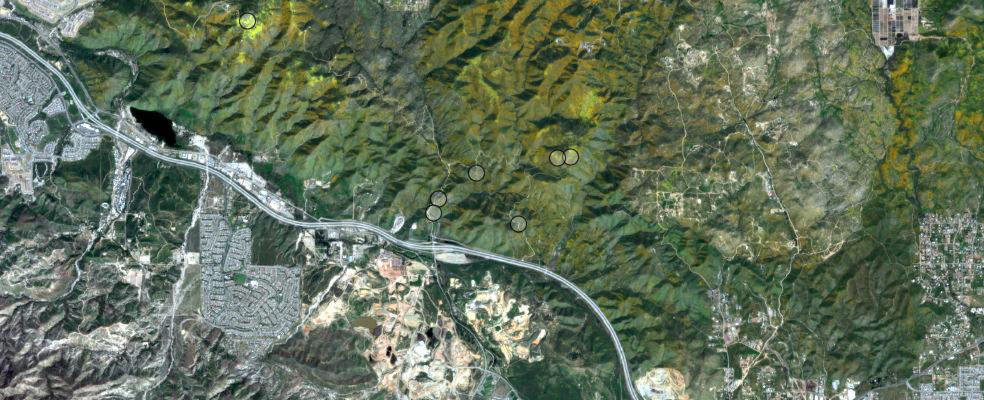

In [10]:
mapA = gis.map(address, zoomlevel = 13)
mapA.extent = extent
mapA

Same as in Part 2, let's use `call_filter_images` to query for satellite imageries that are not only located inside the desired spatial extents, but also in between the specified temporal range (a.k.a. 16 days before 2019-03-18, till 16 days after period).

Also, note that in filtering the tiles to be displayed (that meet the search criteria spatially and temporally), we can also decide what bands to be shown, or if further band arithmetic operations, or built-in products of the imagery need to be applied on top of the returned object. Here, the map view is to display the Natural Color DRA bands.

In [11]:
area = geocode(address, out_sr=landsat.properties.spatialReference)[0]

mapA_selected = call_filter_images(mapA, "2019-03-18")
img_src = mapA_selected

Applicable lockRasterIds= [6339173]


,SHAPE,acquisitiondate,cloudcover,name,objectid,shape_Area,shape_Length
0,"{""rings"": [[[-13013004.261, 3942328.6169999987...",2019-03-30 18:53:51,0,20190330T185351_11SMT_0,6339173,1.737635e+10,527283.206304


In order to test if spectral profile of pixels with the same vegetation cover would resemble each other, we hand-picked a validation point from the site #2, and six training points from the map.

In [12]:
# Choose validation point from ground truth, which we confirm it is poppy field
pV_geom = {'spatialReference': {'latestWkid': 3857, 'wkid': 102100}, 
           'x': -13071749.904321324, 'y': 3996933.3292082152, 
           'type': 'point'}

# Select six points from the map, which we suspect might be poppy fields
p1_geom = {'spatialReference': {'latestWkid': 3857, 'wkid': 102100}, 
           'x': -13068094.362333126, 'y': 3993538.3706691233, 
           'type': 'point'}

p2_geom = {'spatialReference': {'latestWkid': 3857, 'wkid': 102100}, 
           'x': -13068182.527369836, 'y': 3993264.491300152, 
           'type': 'point'}

p3_geom = {'spatialReference': {'latestWkid': 3857, 'wkid': 102100}, 
           'x': -13066566.279683007, 'y': 3993049.649152301, 
           'type': 'point'}

p4_geom = {'spatialReference': {'latestWkid': 3857, 'wkid': 102100}, 
           'x': -13065580.481142372, 'y': 3994334.1833277573, 
           'type': 'point'}

p5_geom = {'spatialReference': {'latestWkid': 3857, 'wkid': 102100}, 
           'x': -13067362.419364316, 'y': 3994033.3081684685, 
           'type': 'point'}

p6_geom = {'spatialReference': {'latestWkid': 3857, 'wkid': 102100}, 
           'x': -13065814.5695415, 'y': 3994310.3923960095, 
           'type': 'point'}

Use `draw_spectral_profile` method if you want to draw the spectral profile of each point in a different figure. Or else, use `draw_spectral_profile_from_list` method to draw the spectral profile of all points in the input list in one plot.

In [13]:
def draw_spectral_profile(map_to_add = mapA, img_src = mapA_selected):
    p_vals = []
    for p in [p1_geom, p2_geom, p3_geom, p4_geom, p5_geom, p6_geom, pV_geom]:
        p_val = get_samples(map_to_add, p, img_src)
        p_vals.append(p_val)
    return p_vals

def draw_spectral_profile_from_list(map_to_add = mapA, img_src = mapA_selected):
    
    p_list = [p1_geom, p2_geom, p3_geom, p4_geom, p5_geom, p6_geom, pV_geom]
    p_vals = get_samples_from_list(map_to_add, p_list, img_src)
    return p_vals

The input parameters `map_to_add` represents a referenced map view variable that will be added the sample points on top as overlay, and `img_src` is used to pick the source of imagery layer being shown. 

In the cell below, we have specified `mapA` as the map view to be added upon, and `mapA_selected` as the image source. The `spectral profile` being plotted via bokeh library can been seen in Fig 3.

In [14]:
"""You can either draw spectral profile of each point, e.g.
"""
# mapA_vals = draw_spectral_profile(mapA, mapA_selected)

"""Or have all points' spectral profile in one plot (Refer to output of cell [10] for mapA)
"""
mapA_vals = draw_spectral_profile_from_list(mapA, mapA_selected)

1  out of  7  :  1176 850 774 643 1038 1707 1853 1597 1954 1204 14 1511 1029
2  out of  7  :  1223 1022 1123 1127 1667 2708 3006 3023 3295 1354 17 2275 1482
3  out of  7  :  1172 880 973 978 1922 2956 3175 2859 3459 1395 15 2338 1557
4  out of  7  :  1150 1006 1314 1294 1798 3083 3373 3689 3663 1477 18 2049 1348
5  out of  7  :  1138 1058 1289 1532 1905 2975 3279 2971 3422 1365 14 2577 1439
6  out of  7  :  1052 880 1247 1339 1834 2737 2956 3000 3175 1356 17 1876 1180
7  out of  7  :  1075 960 1914 1953 2820 4018 4364 4267 4506 1878 19 2234 1332


Fig 3. Spectral Profile of selected points in mapA

If you want to hand pick other observation point(s) from mapA, just copy the statements as commented below to code cells, and then run to prompt for manual selection of new point(s).

```python
"""If you need to further add observation point,
   use `on_click` method to select the new point
"""
print('Click anywhere on the map to plot the spectral profile for that location.')
mapA.on_click(get_samples)
```

Now that we learnt the spectral profile of the training and validation points, let's move on to the next section to quantify the resemblance of the profiles of two pixels.

### Section 3.2. Spectral Angle Mapper

The Spectral Angle Mapper (SAM) calculates the spectral angle between spectral signatures of image pixels and training spectral signatures. The spectral angle θ is defined by Kruse et al. in 1993 as:

$$\theta(x, y) = \cos^{-1} \left( \frac{ \sum_{i=1}^{n} x_i y_i } { \left( \sum_{i=1}^{n} x_i^2 \right)^\frac{1}{2} * \left( \sum_{i=1}^{n} y_i^2 \right)^\frac{1}{2} } \right)$$

The smaller θ, the higher possibility for pixel #1 and #2 belong to the same class  <a href="#References">[2]</a>. Please check the cell below for the implementation details:

In [16]:
def spectral_angle_mapping(x_list, y_list, decimal=4):
    dividend = sum([x*y for x,y in zip(x_list,y_list)])
    x_divisor = np.sqrt(sum(map(lambda x: x ** 2, x_list)))
    y_divisor = np.sqrt(sum(map(lambda y: y ** 2, y_list)))
    res = math.acos(dividend/(x_divisor * y_divisor))
    return round(res, decimal)

for i in range(6):
    print("Point ", str(i+1), " | A/V | ", spectral_angle_mapping(mapA_vals[i], mapA_vals[6]))

Point  1  | A/V |  0.2634
Point  2  | A/V |  0.1602
Point  3  | A/V |  0.1644
Point  4  | A/V |  0.1059
Point  5  | A/V |  0.1488
Point  6  | A/V |  0.0816


Here, A/V means SAM score of training points on mapA VS validation point. Based on the SAM scores, Point 6 (with `θ = 0.0816`) is most likely having the same canopy as the validation site, which is California Poppy in this case, and Points 4 and 5 are the runner-ups with scores of `0.1059` and `0.1488`.

Now that we know points #6 and #4 are more likely to be vegetated with the same canopy, let's extend the timeline both backward and forward, and look at the study site at time ranges of 1 month before and after `mapA`, as to check out how the spectral profiles are like at different growing phase.

The spectral profile of selected points in mapB being plotted via bokeh library can been seen in Fig 4 below.

MapView(layout=Layout(height='400px', width='100%'), zoom=13.0)


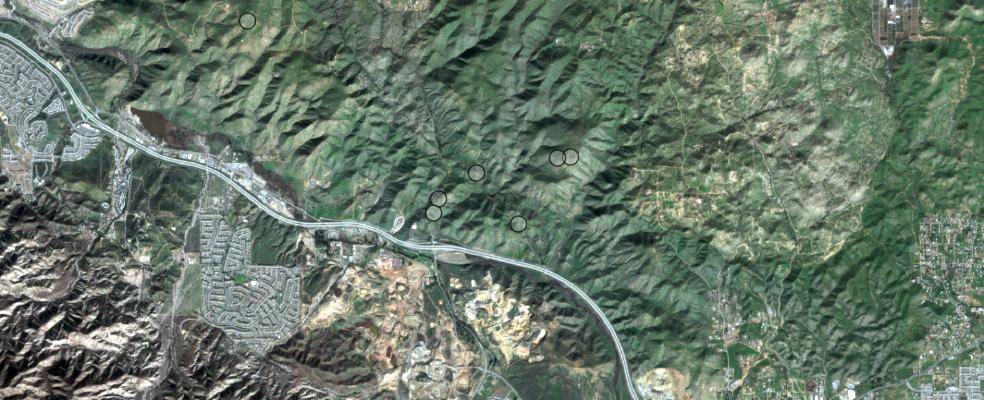

In [17]:
# a month prior to mapA 2019-03-18
mapB = gis.map(address, zoomlevel = 13)
mapB.extent = extent
mapB

In [18]:
mapB_selected = call_filter_images(mapB, "2019-02-18")
img_src = mapB_selected

Applicable lockRasterIds= [5539905, 6002199]


,SHAPE,acquisitiondate,cloudcover,name,objectid,shape_Area,shape_Length
0,"{""rings"": [[[-13013004.261, 3942328.6169999987...",2019-02-23 18:49:08,0.0250,20190223T184907_11SMT_0,6002199,1.737635e+10,527283.206304
1,"{""rings"": [[[-13013006.259, 3942330.6076999977...",2019-02-08 18:45:00,0.0213,20190208T184459_11SMT_0,5539905,1.737529e+10,527267.205892


In [19]:
"""Pick from plotting individually or in a list
"""
# mapB_vals = draw_spectral_profile(mapB, mapB_selected)

mapB_vals = draw_spectral_profile_from_list(mapB, mapB_selected)

1  out of  7  :  1262 822 611 465 647 961 1105 760 1176 1139 21 1058 726
2  out of  7  :  1286 1117 1113 973 1460 2842 3227 3050 3397 1277 20 2233 1471
3  out of  7  :  1265 1027 1002 776 1420 2772 3102 2704 3215 1298 21 2352 1497
4  out of  7  :  1265 997 997 909 1280 2038 2231 2481 2351 1184 28 2319 1669
5  out of  7  :  1259 1206 1277 1497 1733 2448 2741 2350 2611 1126 21 3174 1866
6  out of  7  :  1194 957 922 841 1099 1856 2003 1993 2099 1067 24 1674 1152
7  out of  7  :  1199 928 928 714 1234 2439 2638 2648 2886 1401 29 1905 1240


Fig 4. Spectral Profile of selected points in mapB

In [20]:
for i in range(6):
    print("Point ", str(i+1), 
          "\t| B/V |\t", spectral_angle_mapping(mapB_vals[i], mapB_vals[6]))

Point  1 	| B/V |	 0.3607
Point  2 	| B/V |	 0.0584
Point  3 	| B/V |	 0.068
Point  4 	| B/V |	 0.1603
Point  5 	| B/V |	 0.2477
Point  6 	| B/V |	 0.1158


Based on the SAM scores, Point 2 (with `θ = 0.0584`) is most likely having the same canopy as the validation site, which is California Poppy in this case, and Points 3 and 6 are the runner-ups with scores of `0.068` and `0.1158`. From the SAM scores calculated in `mapA`, the top 3 optimized results are of points [6,4,5], while with `mapB` the top 3 are of points [2,3,6]. The difference found in the result sets could be largely due to that the growing status of the vegetation at various points are not in sync.

Again, let's look at the SAM of training points at site #2 at the time range 1 month after 2019-03-18. And the spectral profile of selected points in `mapC` being plotted via bokeh library can been seen in Fig 5 below.

MapView(layout=Layout(height='400px', width='100%'), zoom=13.0)


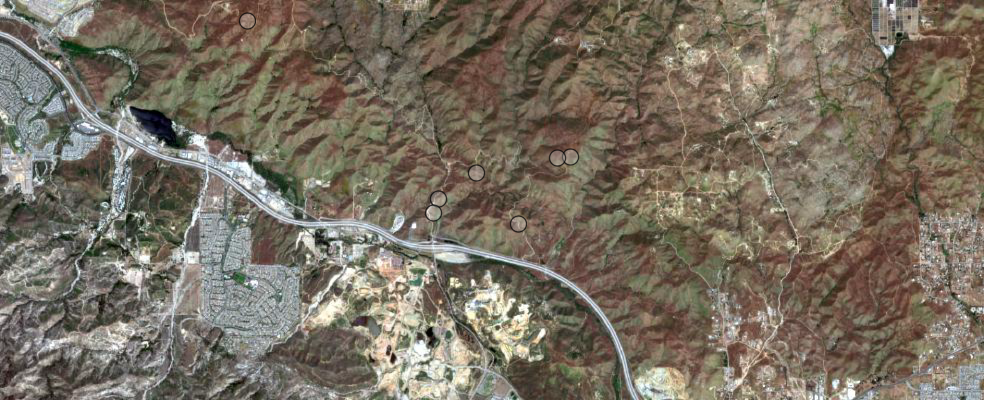

In [21]:
mapC = gis.map(address, zoomlevel = 13)
mapC.extent = extent
mapC

In [22]:
mapC_selected = call_filter_images(mapC, "2019-04-18")
img_src = mapC_selected

Applicable lockRasterIds= [6685982]


,SHAPE,acquisitiondate,cloudcover,name,objectid,shape_Area,shape_Length
0,"{""rings"": [[[-13013004.261, 3942328.6169999987...",2019-04-24 18:58:34,0.0134,20190424T185834_11SMT_0,6685982,1.737635e+10,527283.206304


In [23]:
"""Pick from plotting individually or in a list
"""
# mapC_vals = draw_spectral_profile(mapC, mapC_selected)

mapC_vals = draw_spectral_profile_from_list(mapC, mapC_selected)

1  out of  7  :  1290 1046 967 1073 1541 2083 2323 1916 2557 895 15 2370 1610
2  out of  7  :  1349 1233 1324 1511 1843 2406 2671 2709 2991 955 17 2824 1884
3  out of  7  :  1290 1249 1346 1752 2083 2718 3085 2845 3372 971 17 3133 1944
4  out of  7  :  1236 1045 1034 1243 1481 1887 2186 2239 2530 927 20 2731 1784
5  out of  7  :  1267 1228 1323 1701 1981 2409 2657 2534 2916 913 14 3348 1851
6  out of  7  :  1216 1125 1144 1461 1575 1880 2176 2306 2493 821 18 2561 1656
7  out of  7  :  1189 984 938 1231 1478 1685 1951 2028 2329 970 15 2889 1782


Fig 5. Spectral Profile of selected points in mapC

In [28]:
for i in range(6):
    print("Point ", str(i+1), 
          "\t| C/V |\t", spectral_angle_mapping(mapC_vals[i], mapC_vals[6]))

Point  1 	| C/V |	 0.1405
Point  2 	| C/V |	 0.1348
Point  3 	| C/V |	 0.153
Point  4 	| C/V |	 0.0656
Point  5 	| C/V |	 0.1
Point  6 	| C/V |	 0.1052


For the current time range (2019-04-18), we can again determine what's the probability of each point having the same canopy as the validation point based on the SAM scores. Point 4 (with `θ = 0.0495`) is most likely having the same canopy as the validation site, and Points 4 and 5 are the runner-ups with score of `0.1` and `0.1052`, which is the same as the results out of mapA.

SAM has been effective in calculting spectral angle between spectral signatures of image pixels and training spectral profiles. In the next section, we will explore how to combine vegetation sampling and SAM.

### Section 3.3. Point-Frame Sampling of Pixels' Spectral Signatures

Plants' growing conditions, and their responses to various vegetation treatments such as defoliation or environmental perturbations, can be measured by `vegetation density`, which in plant ecology, means the number of individuals of a given species that occurs within a given sample unit or study area in a certain time range.

There are different sampling methods to determine the density of vegetation cover, e.g. `Point-Frame` for grasslands, `Point-Quarter` for forests, `Quadrat` for herbs and shrubs. In this section, we will discuss the usage of `Point-Frame Sampling`.


#### 3.3.1. About Point-Frame Sampling Method

The point frame method, first suggested as an instrument to measure cover by Levy and Madden <a href="#References">[3]</a> in the early 1930's, is to determine cover based on point sampling. The prototype consists of a standing frame that holds a set of vertically aligned pins, which are lowered as sampling points to record hits. The vegetation spatial patterns, distance between plants, and size of individual plants decide the optimum number and arrangement of points within the frame <a href="#References">[4]</a>. 

Each point frame is usually considered as a sample unit, and each point within serves as a small "probe" used to measure what plant or soil attribute occurs at the spot. Many variations on the point theme have been applied in operational practices, e.g. laser points, or cross-hairs <a href="#References">[5]</a> (as shown in the figure below).

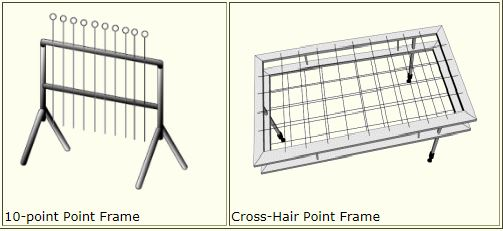
Fig 6. 10-point Point Frame on the left, and cross-hair point frame on the right (source: <a href="#References">[5]</a>)

The point frame is best suited for grasslands and other low-growing vegetation, but becomes impractical in taller shrublands because of difficulties in placing the point frame above tall plants. It is also best suited to vegetation with dense cover, where there is less likelihood that all points within the frame will record bare ground.

As a technique traditionally used for ground surveying, in order to determine or estimate land cover, Point-Frame Sampling has been combined with Remote Sensing imageries, and modified to perform estimation remotely with satellite images in the past decades. The rest of this section is to introduce the implementation of its use with satellite products.

**In brief**, the ratio of number of points being vegetated with Poppy Fields (or with spatial signature similar to that of California Poppy) is to be calculated here, in representation of the `vegetation density` of Poppy, in the means of `Point Frame Sampling` that calculates total number of validated poles per standing frame.


#### 3.3.2. Implementation of Point-Frame Sampling

Use `get_samples_points` method defined below to create a list of sampling points based on point frame methodology, based on the sampling area's extent, and number of rows and columns desired to be measured:

In [29]:
def get_sample_points(m, extent, y_rows=9, x_columns=24):
    x_gap = math.floor((extent['xmax'] - extent['xmin'])/x_columns)
    y_gap = math.floor((extent['ymax'] - extent['ymin'])/y_rows)
    points_list = []

    for y_count in range(1, y_rows):
        y_val = extent['ymin'] + y_count*y_gap
        for x_count in range(1, x_columns):
            x_val = extent['xmin'] + x_count*x_gap
            new_point = {'spatialReference': {'latestWkid': 3857, 'wkid': 102100}, 
                         'x': 0, 'y': 0, 
                         'type': 'point'}
            new_point['x'] = x_val
            new_point['y'] = y_val
            points_list.append(new_point)
            m.content.draw(new_point)
    
    return points_list

Applicable lockRasterIds= [6339173]


,SHAPE,acquisitiondate,cloudcover,name,objectid,shape_Area,shape_Length
0,"{""rings"": [[[-13013004.261, 3942328.6169999987...",2019-03-30 18:53:51,0,20190330T185351_11SMT_0,6339173,1.737635e+10,527283.206304


MapView(layout=Layout(height='400px', width='100%'), zoom=14.0)


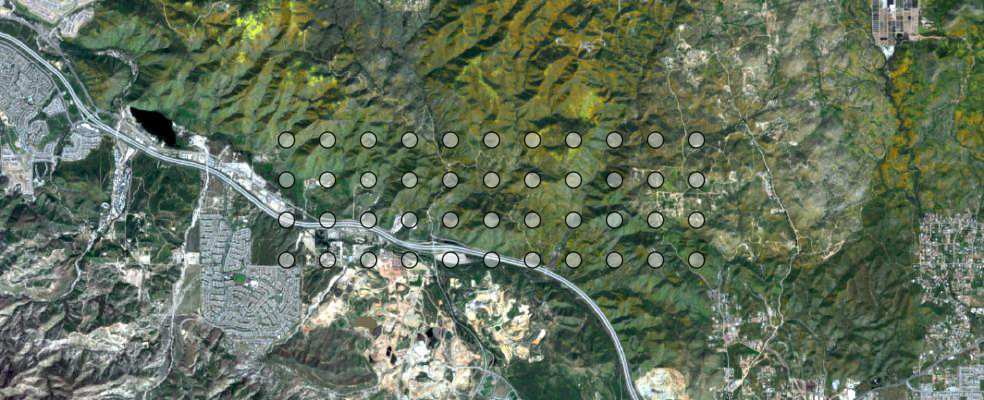

In [30]:
mapZ = gis.map(address, zoomlevel = 13)
mapZ.extent = extent
mapZ_selected = call_filter_images(mapZ, "2019-03-18", extent)
img_src = mapZ_selected

mapZ

Similar to section 3.2, but this time instead of getting the samples from the seven sites, we select evenly distributed sample points from the input area (with `get_sample_points(...)`), and retrieve the spectral profiles of the sample points in the frame (using `get_samples_from_list`). And the spectral profile of selected points in mapZ being plotted via bokeh library can been seen in Fig 7.

In [32]:
p_list = get_sample_points(mapZ, mapZ.extent, 5, 12)
mapZ_vals = get_samples_from_list(mapZ, p_list, mapZ_selected, print_log=False)

Fig 7. Spectral Profile of selected points in mapZ

The statistics retrieved from the point-frame sampling can provide for a rough estimation of the vegetation density of the study area. `do_list_spectral_angle_mapping` calculates the SAM scores of the sampled points, decides how many points in the sample falls under the threshold, and then calculates the density.

In [35]:
def do_list_spectral_angle_mapping(vals, base_val, threshold=0.2, label="Z/V", print_log=True):
    count = 0
    for i in range(len(vals)):
        res = spectral_angle_mapping(vals[i], base_val)
        if res>threshold:
            val = "--"
        else:
            val = "Y"
            count += 1
        if print_log:
            print("Point ", str(i+1), "\t| ", label, 
                  " | ", res, "\t| of high prob? | ", val)
        
    density = round(count/len(vals),4)
    if print_log:
        print(count, "/", len(vals), 
              " spectral profiles are significantly similar, at ", density)
    return density

In [38]:
do_list_spectral_angle_mapping(mapZ_vals, mapA_vals[6], threshold=0.2111, label="Z/V")

Point  1 	|  Z/V  |  0.3148 	| of high prob? |  --
Point  2 	|  Z/V  |  0.2943 	| of high prob? |  --
Point  3 	|  Z/V  |  0.1697 	| of high prob? |  Y
Point  4 	|  Z/V  |  0.2038 	| of high prob? |  Y
Point  5 	|  Z/V  |  0.3793 	| of high prob? |  --
Point  6 	|  Z/V  |  0.3496 	| of high prob? |  --
Point  7 	|  Z/V  |  0.2092 	| of high prob? |  Y
Point  8 	|  Z/V  |  0.108 	| of high prob? |  Y
Point  9 	|  Z/V  |  0.1607 	| of high prob? |  Y
Point  10 	|  Z/V  |  0.1842 	| of high prob? |  Y
Point  11 	|  Z/V  |  0.135 	| of high prob? |  Y
Point  12 	|  Z/V  |  0.3576 	| of high prob? |  --
Point  13 	|  Z/V  |  0.3198 	| of high prob? |  --
Point  14 	|  Z/V  |  0.1511 	| of high prob? |  Y
Point  15 	|  Z/V  |  0.1951 	| of high prob? |  Y
Point  16 	|  Z/V  |  0.2111 	| of high prob? |  Y
Point  17 	|  Z/V  |  0.1355 	| of high prob? |  Y
Point  18 	|  Z/V  |  0.0816 	| of high prob? |  Y
Point  19 	|  Z/V  |  0.1831 	| of high prob? |  Y
Point  20 	|  Z/V  |  0.1489 	| of h

0.75

Density at 0.75 is a good score for site #2. To create a reference for comparison, let's calculate the density for a different site (site #3).

In [39]:
address = 'Anza-Borrego Desert State Park'
location = [33.124406, -116.394491] # Anza-Borrego Desert State Park
area = geocode(address, out_sr=landsat.properties.spatialReference)[0]

Applicable lockRasterIds= [5712177, 5796089, 5969982, 6071918, 6178345, 6316825, 6316953]


,SHAPE,acquisitiondate,cloudcover,name,objectid,shape_Area,shape_Length
0,"{""rings"": [[[-12893221.362399999, 3952747.0520...",2019-03-07 18:47:33,0.005648,20190307T184732_11SNS_0,5796089,1.702045e+10,521855.201410
1,"{""rings"": [[[-12996779.6169, 3823142.847800001...",2019-03-05 18:50:02,0.000000,20190305T185002_11SNS_0,5712177,5.727003e+09,352967.361188
2,"{""rings"": [[[-12893221.362399999, 3952747.0520...",2019-03-17 18:36:31,0.000300,20190317T183630_11SNS_0,5969982,1.702045e+10,521855.201410
3,"{""rings"": [[[-12891830.5979, 4073688.405500002...",2019-03-17 18:40:56,0.000800,20190317T184055_11SNT_0,6316825,1.726038e+10,520730.078891
4,"{""rings"": [[[-12893221.362399999, 3952747.0520...",2019-03-22 18:45:16,0.007600,20190322T184515_11SNS_0,6316953,1.702045e+10,521855.201410


MapView(layout=Layout(height='400px', width='100%'))


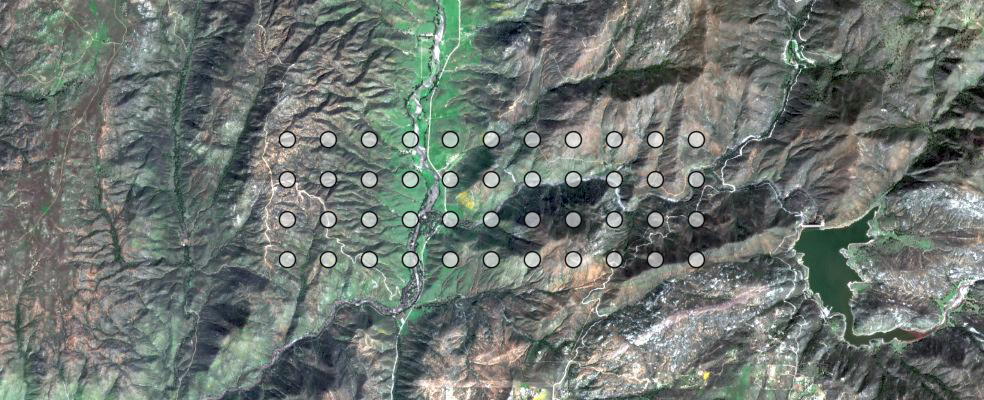

In [40]:
mapY = gis.map(address)
mapY.extent = {'spatialReference': {'latestWkid': 3857, 'wkid': 102100},
               'xmin': -13011462.110827148,
               'ymin': 3909575.644877971,
               'xmax': -13002060.356348082,
               'ymax': 3913397.496292225}

mapY_selected = call_filter_images(mapY, "2019-03-18", extent=mapY.extent)
img_src = mapY_selected

mapY

Same here, targeting at a different site (site#3), we select evenly distributed sample points from the input area (with get_sample_points(...)), and retrieve the spectral profiles of the sample points in the frame (using get_samples_from_list). And the spectral profile of selected points in mapY being plotted via bokeh library can been seen in Fig 8.

In [42]:
p_list = get_sample_points(mapY, mapY.extent, 5, 12)
mapY_vals = get_samples_from_list(mapY, p_list, mapY_selected, print_log=False)

Fig 8. Spectral Profile of selected points in mapY

In [43]:
do_list_spectral_angle_mapping(mapY_vals, mapA_vals[6], threshold=0.2111, label="Y/V")

Point  1 	|  Y/V  |  0.3173 	| of high prob? |  --
Point  2 	|  Y/V  |  0.2694 	| of high prob? |  --
Point  3 	|  Y/V  |  0.234 	| of high prob? |  --
Point  4 	|  Y/V  |  0.3047 	| of high prob? |  --
Point  5 	|  Y/V  |  0.2874 	| of high prob? |  --
Point  6 	|  Y/V  |  0.3127 	| of high prob? |  --
Point  7 	|  Y/V  |  0.2496 	| of high prob? |  --
Point  8 	|  Y/V  |  0.2603 	| of high prob? |  --
Point  9 	|  Y/V  |  0.3456 	| of high prob? |  --
Point  10 	|  Y/V  |  0.4254 	| of high prob? |  --
Point  11 	|  Y/V  |  0.3471 	| of high prob? |  --
Point  12 	|  Y/V  |  0.4022 	| of high prob? |  --
Point  13 	|  Y/V  |  0.3487 	| of high prob? |  --
Point  14 	|  Y/V  |  0.3182 	| of high prob? |  --
Point  15 	|  Y/V  |  0.2086 	| of high prob? |  Y
Point  16 	|  Y/V  |  0.2456 	| of high prob? |  --
Point  17 	|  Y/V  |  0.3734 	| of high prob? |  --
Point  18 	|  Y/V  |  0.4653 	| of high prob? |  --
Point  19 	|  Y/V  |  0.3325 	| of high prob? |  --
Point  20 	|  Y/V  |  0

0.0455

Vegetation Density of point-frame sampling for site #3 is 0.0455, significantly lower than that of site #2, and it is safe to assume that scale of poppy blooming in site #3 is smaller.

In summary, Part 3 covers methods to quantitatively study vegetation coverage at pixel level, e.g. spectral profiling, spectral angle mapping, point-frame sampling, and vegetation density calculation. Next, we will further discuss how to monitor the vegetation health over large areas.

## Part 4. Vegetation Health or Agriculture Index

Parts 1 to 3 take advantage of the Default Rendering of Sentinel Imagery, which is Natural Color with DRA. There are other Remote Sensing Based Indices that can help determine the vegetation conditions, for example, the Agriculture Index, and the Vegetation Health Index. 

The following experiment is using `Agriculture with DRA` to visualize the vegetation difference at the same study area but across two time ranges. You may also use `Vegetation Health Index` or other indices to achieve the same effect.

In [10]:
# Hovering back to Lake Elsinore
address = 'Lake Elsinore, Riverside County, CA'
location = [33.731534, -117.392019] # Lake Elsinore
extent = {   'spatialReference': {'latestWkid': 3857, 'wkid': 102100},
             'xmin': -13352192.275308348,
             'ymin': 4181137.3397342945,
             'xmax': -13334153.136633072,
             'ymax': 4191838.523694205
         }

In [11]:
# agriculture index
target_image_src = apply(landsat, "Agriculture with DRA")

In the `filter_combined_images` method defined below, given the temporal range and the spatial boundingbox of the FeatureClass, filter_by(...) is performed to the imagery layer with the criteria, and when one or more mosaic tiles meet the requirements, get the `mean` of these tiles and add to current map.

Then, `call_filter_combined_images` serves as a wrapper that parse the date string and create desired [start_datetime, end_datetime] and triggers the call to `filter_combined_images`.

In [12]:
def filter_combined_images(my_map, start_datetime, end_datetime, target_image_src=landsat, 
                           save_to_file = False, extent=area['extent']):
    
    geom_obj = Geometry(extent)
    selected = target_image_src.filter_by(where="(Category = 1) AND (CloudCover <=0.0025)",
                                 time=[start_datetime, end_datetime],
                                 geometry=geometry.filters.intersects(geom_obj))
    id_list = selected.filtered_rasters()
    print("Applicable lockRasterIds=", id_list)
    
    if not id_list:
        return None
    else:
        date_title_from = start_datetime.strftime("%m_%d_%Y")
        date_title_to = end_datetime.strftime("%m_%d_%Y")
        my_map.content.add(selected.mean(), {"title": date_title_from + " to " + date_title_to + " at " + address})
        
        if save_to_file:
            selected.export_image(bbox=extent, size=[1200,450], f='image', 
                                  save_folder='.', 
                                  save_file='img' + date_title_from + " to " + date_title_to + " at " + address + '.jpg')

        fs = selected.query(out_fields="AcquisitionDate, name, CloudCover")
        tdf = fs.sdf  
        
        return tdf

In [13]:
def call_filter_combined_images(my_map, date_str, extent=area['extent']):
    datetime_object = dt.datetime.strptime(date_str, '%Y-%m-%d')
    start_datetime = datetime_object - dt.timedelta(days=no_of_days)
    end_datetime = datetime_object + dt.timedelta(days=no_of_days+1)
    tdf = filter_combined_images(my_map, start_datetime, end_datetime, target_image_src, False, extent)
    if tdf is not None:
        display(tdf.head())

In [14]:
map4 = gis.map(address, zoomlevel = 12)
map4.extent = extent

call_filter_combined_images(map4, "2019-03-18", extent)

Applicable lockRasterIds= [6084205, 6153267]


,SHAPE,acquisitiondate,cloudcover,name,objectid,shape_Area,shape_Length
0,"{""rings"": [[[-13257110.9355, 4182793.701999999...",2019-03-18 19:05:08,0,20190318T190508_11SKV_0,6084205,1.810900e+10,538285.191379
1,"{""rings"": [[[-13309623.2423, 4313473.204899996...",2019-03-18 18:56:52,0,20190318T185652_10SGE_0,6153267,1.810571e+10,538236.250417


In [15]:
map5 = gis.map(address, zoomlevel = 12)
map5.extent = extent

call_filter_combined_images(map5, "2018-04-09", extent)

Applicable lockRasterIds= [2101497, 2186370, 2186371]


,SHAPE,acquisitiondate,cloudcover,name,objectid,shape_Area,shape_Length
0,"{""rings"": [[[-13309623.2423, 4313473.204899996...",2018-04-12 18:49:51,0.0018,20180412T221507_10SGE_0,2101497,1.810571e+10,538236.250417
1,"{""rings"": [[[-13309623.2423, 4313473.204899996...",2018-04-22 18:47:42,0.0003,20180422T234001_10SGE_0,2186371,1.810571e+10,538236.250417
2,"{""rings"": [[[-13313900.2247, 4190154.183799997...",2018-04-22 18:47:42,0.0002,20180422T234001_10SGD_0,2186370,1.771076e+10,532333.167074


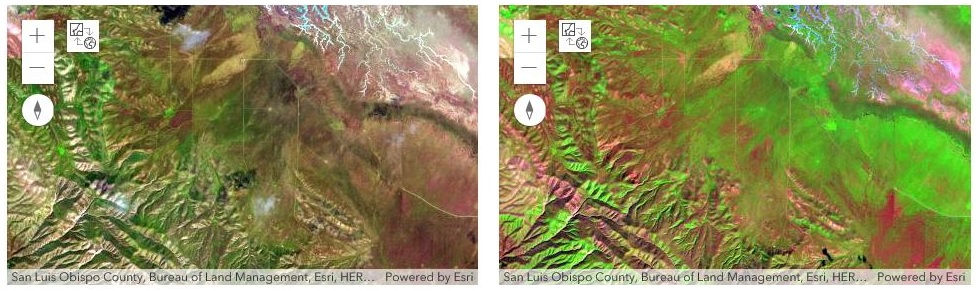

In [3]:
map4.layout=Layout(flex='1 1', padding='10px', height='300px')
map5.layout=Layout(flex='1 1', padding='10px', height='300px')

# Left: 2018-04-09
# Right: 2019-03-18
box = HBox([map5, map4])
box

From the `HBox` comparative visualization of `map5` (Spring 2018) and `map4` (Spring 2019), we can see how the vegetation vigor and density have improved for site #2 (Lake Elsinore). With the same approach done for site #3 (Anza-Borrego Desert), the vegetation improvement is also spotted, though not as significant. In Part 5 of this notebook, a quantitative assessment of the vegetation as a time-series will be discussed.

## Part 5. Quantitative Assessment with time-series NDVI imageries

In [18]:
# still at site #2 - Lake Elsinore
area = geocode(address, out_sr=landsat.properties.spatialReference)[0]

From the item page of `Sentinel-2 View` curated by `Esri Living Atlas`, we can see the details of multi-spectral bands, in which bands #8 (NIR) and #4 (RED) will be used to calculate the NDVI values (as seen in Table 1). In order to calculate the difference of NDVI values between new and old time ranges, we use the following defintion:
```PYTHON
diff = ndvi(new, '8 4') - ndvi(old, '8 4')
```

<h5><center>Table 1. Multi-Spectral bands of Sentinel-2</center></h5>

| Band 	| Description         	| Wavelength (µm) 	| Resolution (m) 	|
|------	|---------------------	|-----------------	|----------------	|
| 1    	| Coastal aerosol     	| 0.433 - 0.453   	| 60             	|
| 2    	| Blue                	| 0.458 - 0.523   	| 10             	|
| 3    	| Green               	| 0.543 - 0.578   	| 10             	|
| 4    	| Red                 	| 0.650 - 0.680   	| 10             	|
| 5    	| Vegetation Red Edge 	| 0.698 - 0.713   	| 20             	|
| 6    	| Vegetation Red Edge 	| 0.733 - 0.748   	| 20             	|
| 7    	| Vegetation Red Edge 	| 0.773 - 0.793   	| 20             	|
| 8    	| NIR                 	| 0.785 - 0.900   	| 10             	|
| 8A   	| Narrow NIR          	| 0.855 - 0.875   	| 20             	|
| 9    	| Water vapour        	| 0.935 - 0.955   	| 60             	|
| 10   	| SWIR – Cirrus       	| 1.365 - 1.385   	| 60             	|
| 11   	| SWIR-1              	| 1.565 - 1.655   	| 20             	|
| 12   	| SWIR-2              	| 2.100 - 2.280   	| 20             	|

In the `filter_images_diff` method defined below, given the temporal range and the spatial boundingbox of the FeatureClass, filter_by(...) is performed to the imagery layer with the criteria, and when one or more mosaic tiles meet the requirements, get the mean of these tiles and add to current map.

The `subtract_images` method serves as a wrapper that parse the date strings and create desired [start_datetime1, end_datetime1] for the new time range, and [start_datetime2, end_datetime2] for the new time range, and then invokes the call to `filter_images_diff`.

In [19]:
def filter_images_diff(my_map, start_datetime1, end_datetime1, 
                               start_datetime2, end_datetime2, 
                               target_image_src=landsat, extent = area['extent']):
    
    geom_obj = Geometry(extent)
    selected1 = target_image_src.filter_by(where="(Category = 1) AND (CloudCover <=0.0025)",
                                 time=[start_datetime1, end_datetime1],
                                 geometry=geometry.filters.intersects(geom_obj))
    id_list1 = selected1.filtered_rasters()
    print("1: Applicable lockRasterIds=", id_list1)
    
    selected2 = target_image_src.filter_by(where="(Category = 1) AND (CloudCover <=0.0025)",
                                 time=[start_datetime2, end_datetime2],
                                 geometry=geometry.filters.intersects(geom_obj))
    id_list2 = selected2.filtered_rasters()
    print("2: Applicable lockRasterIds=", id_list2)
    
    if not id_list1 or not id_list2:
        return False
    else:
        return [selected2.blend(), selected1.blend()]

In [20]:
def subtract_images(my_map, date_str1, date_str2, extent = area['extent']):
    datetime_object = dt.datetime.strptime(date_str1, '%Y-%m-%d')
    start_datetime1 = datetime_object - dt.timedelta(days=no_of_days)
    end_datetime1 = datetime_object + dt.timedelta(days=no_of_days)

    datetime_object = dt.datetime.strptime(date_str2, '%Y-%m-%d')
    start_datetime2 = datetime_object - dt.timedelta(days=no_of_days)
    end_datetime2 = datetime_object + dt.timedelta(days=no_of_days)

    return filter_images_diff(my_map, 
                       start_datetime1, end_datetime1, 
                       start_datetime2, end_datetime2, 
                       landsat, extent) 

`map6` displays the difference between two time ranges for site #2.

1: Applicable lockRasterIds= [6084205, 6153267]
2: Applicable lockRasterIds= [2101497, 2186370, 2186371]


MapView(layout=Layout(height='400px', width='100%'), zoom=12.0)


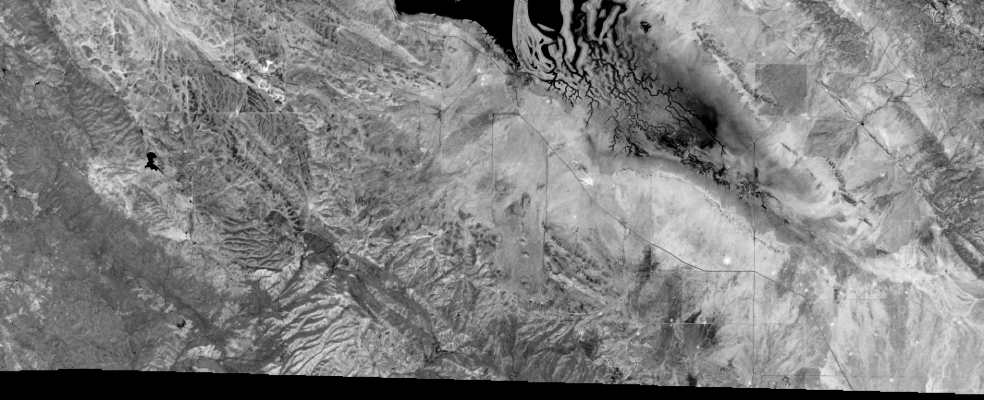

In [21]:
map6 = gis.map(address, zoomlevel = 12)
map6.extent = extent

[new, old] = subtract_images(map6,"2019-03-18", "2018-04-09", extent)
map6

In [22]:
ndvi_diff = ndvi(new, '8 4') - ndvi(old, '8 4')
map6.content.add(ndvi_diff)

In [23]:
diff = stretch(composite_band([ndvi(old, '8 4'),
                               ndvi(new, '8 4'),
                               ndvi(old, '8 4')]), 
                               stretch_type='stddev',  num_stddev=3, min=0, max=255, dra=True, astype='u8')
map6.content.add(diff)

Now that we have obtained the NDVI difference between Spring 2019 and 2018, it is handy to have individual class splits based on the difference levels, and plot a histogram using the same bins (or class splits). `histogram_percent_perStep` calculates the percent of pixels inside each of the 5 bins, and `pie_plot` draws the histogram in a pie chart.

In [25]:
"""Use method below to get % of pixel values>=threshold
"""
def histogram_percent(diff, extent, threshold = 150):
    pixx = (extent['xmax'] - extent['xmin']) / 1200.0
    pixy = (extent['ymax'] - extent['ymin']) / 450.0
    res = diff.compute_histograms(extent, pixel_size={'x':pixx, 'y':pixy})
    
    numpix = 0
    histogram = res['histograms'][0]['counts'][1:threshold]
    for i in histogram:
        numpix += i
    count_threshold = numpix
    acres_threshold = 0.00024711 * count_threshold * pixx * pixy
        
    histogram = res['histograms'][0]['counts'][threshold:]
    for i in histogram:
        numpix += i

    sqmarea = numpix * pixx * pixy # in sq. m
    acres = 0.00024711 * sqmarea
    
    HTML('<h3>Vegetation improvement is reflected in <i>{:,} out of {:,} acres</i></h3>.'.format(int(acres - acres_threshold), int(acres)))
    return round((1-count_threshold/numpix),4)


"""or use the method below to have the histogram count splitted into bins
""" 
def histogram_percent_perStep(diff, extent, step=50):
    pixx = (extent['xmax'] - extent['xmin']) / 1200.0
    pixy = (extent['ymax'] - extent['ymin']) / 450.0
    res = diff.compute_histograms(extent, pixel_size={'x':pixx, 'y':pixy})
    percent_list = []

    num = math.ceil(250/step)
    for idx in range(0,num):
        numpix = 0
        histogram = res['histograms'][0]['counts'][step*idx+1:step*(idx+1)]
        for i in histogram:
            numpix += i
        percent_list.append(numpix)

    return [round(x/sum(percent_list),4) for x in percent_list]

In [26]:
""" Use below statement to get % of pixel values>=threshold
histogram_percent(diff,extent)
"""

percent_list = histogram_percent_perStep(diff, extent)
percent_list

[0.0171, 0.1874, 0.5947, 0.149, 0.0517]

Based on the density calculation, the vegetation conditions can be categorized into five levels, depending on the percent of its dense degrees, which are namely, 'Low vegetation improvement', 'Low-to-Moderate vegetation improvement', 'Moderate vegetation improvement', 'Moderate-to-High vegetation improvement', and 'High vegetation improvement'.

For instance, if [x1%, x2%, x3%, x4%, x5%] are the results of the histogram calculation (here, `histogram_percent_perStep`), then we can safely assume that based on sampling results, x1% of the study area is considered undergoing low vegetation improvement, x3% of it under moderate vegetation improvement, and x5% with high vegetation improvement.

In [1]:
%matplotlib inline

"""Use the method below to draw the histogram in a pie chart
"""
def pie_plot(percent_list):
    plt.title('Distribution by Vegetation Condition', y=-0.1)
    str_labels=['Low vegetation improvement', 'L-M vegetation improvement', 'Moderate vegetation improvement', 
                               'M-H vegetation improvement', 'High vegetation improvement']
    combo_labels = [str_labels[0] + " " + str(round(percent_list[0]*100,2)) +"%",
                    str_labels[1] + " " + str(round(percent_list[1]*100,2)) +"%",
                    str_labels[2] + " " + str(round(percent_list[2]*100,2)) +"%",
                    str_labels[3] + " " + str(round(percent_list[3]*100,2)) +"%",
                    str_labels[4] + " " + str(round(percent_list[4]*100,2)) +"%"]
    plt.pie(percent_list, labels=combo_labels);
    plt.axis('equal');

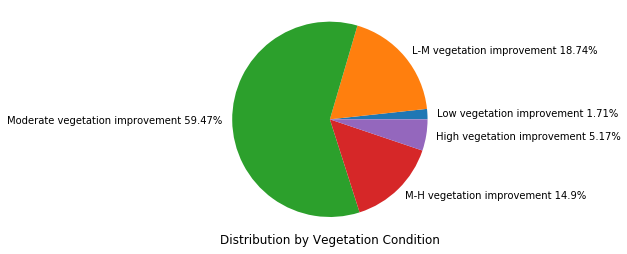

In [2]:
pie_plot(percent_list)

Based on the spectral nature of poppy fields and empirical observations of the validation points, Poppy fields have been identified to only reside in the `moderate vegetation improvement` category. Those pixels classified as moderate vegetation improvement are more likely to be of California Poppy, but not vice versa. There could be other vegetation types that are being classified as moderate vegetation improvement.

We are excluding the `low vegetation improvement` here, since it could be largely contributed by tolerance in collecting the reflectance, or data conversion, and only considering moderate, M-H, or high vegetation improved pixels as significant increase in vegetation coverage for general type. 

From the pie chart, We can see that 59.47% of the study area is shown as moderate vegetation improved, and 79.54% is categorized as Moderate, M-H, and High vegetation improved.

In [29]:
# Hovering to site #3
address = 'Anza-Borrego Desert State Park'
area = geocode(address, out_sr=landsat.properties.spatialReference)[0]

location = [33.124406, -116.394491]
extent = {   'spatialReference': {'latestWkid': 3857, 'wkid': 102100},
             'xmin': -12987499.639412005,
             'ymin': 3910331.9028531285,
             'xmax': -12982798.762172341,
             'ymax': 3912242.8285603086}

1: Applicable lockRasterIds= [5712177, 5969982, 6071918]
2: Applicable lockRasterIds= [2118412]


MapView(layout=Layout(height='400px', width='100%'), zoom=12.0)


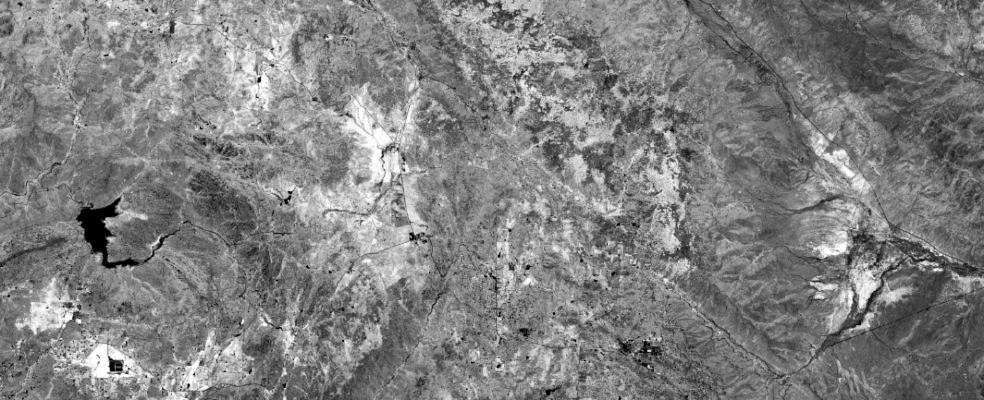

In [30]:
map7 = gis.map(address, zoomlevel = 12)
map7.extent = extent

[new, old] = subtract_images(map7, "2019-03-18", "2018-04-09", extent)
map7

In [31]:
ndvi_diff = ndvi(new, '8 4') - ndvi(old, '8 4')
map7.content.add(ndvi_diff)

In [32]:
diff = stretch(composite_band([ndvi(old, '8 4'),
                               ndvi(new, '8 4'),
                               ndvi(old, '8 4')]), 
                               stretch_type='stddev',  num_stddev=3, min=0, max=255, dra=True, astype='u8')
map7.content.add(diff)

In [34]:
""" Use below statement to get % of pixel values>=threshold
histogram_percent(diff,extent)
"""
percent_list = histogram_percent_perStep(diff, extent)
percent_list

[0.0239, 0.167, 0.3337, 0.3694, 0.106]

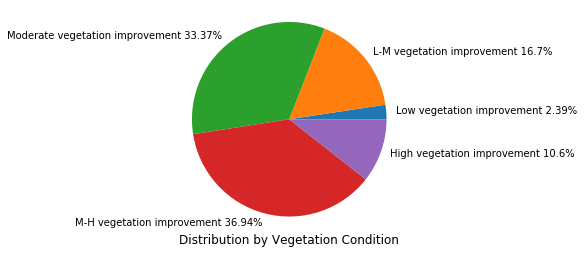

In [3]:
pie_plot(percent_list)

For site #3, as shown in pie chart, 33.37% of the study area is shown as `moderate vegetation improved`, and 80.91% is categorized as Moderate, M-H, and High vegetation improved. Compared to site #2, we can see that the vegetation vigor and density of moderate vegetation improved lands (in which, California Poppy is observed as the major vegetation) in site #3 is not as high (33.37% < 59.47%), though, for overall vegetation types, the increase in growing conditions are almost the same (80.91% VS. 79.54%). This conclusion also corresponds to what is achieved in Part 3 using SAM scores that Poppy density in site #2 is higher than that in site #3.


## Conclusion

In this sample, we have used various Remote Sensing Indices retrieved from Sentinel Imageries, namely, the Natural Color with DRA, the Agriculture Index, the Vegetation Health Index, and NDVI, and also taken advantage of the pixel sampling, point-frame sampling methods, SAM scores, vegetation density, and also time-series NDVI differences, in order to monitor super blooming, compare the sites with historic scenes, capture the differences in vegetation conditions, calculate the vegetation density of blooming, and obtain the probability of vegetation improvement. In doing such, users can determine the scale of super blooming and the area/percentage of improved vegetation coverage for the study sites.

Also to note, apart from the traditional sampling methods introduced here, approaches like [Maximum Likelihood Classification](https://pro.arcgis.com/en/pro-app/tool-reference/spatial-analyst/how-maximum-likelihood-classification-works.htm), or [Pixel-based Image classification provided by arcgis.learn](https://developers.arcgis.com/python/guide/pixel-based-classification) can also be used to solve the issue, and in that case, the sampling methods introduced here could be applied as validation measures. 

## References

<a href='#Introduction'>[1]</a> Chris Jennewein, "Traffic Snarls on I-15 During Another Weekend of ‘Super Bloom Apocalypse’", Times of San Diego, March 23, 2019. [Online]. https://timesofsandiego.com/life/2019/03/23/traffic-snarls-on-i-15-during-another-weekend-of-super-bloom-apocalypse/, [Assessed August 9, 2019]

<a href='#Section-3.2.-Spectral-Angle-Mapper'>[2]</a> Kruse, F. A., Lefkoff, A. B. et al., "The Spectral Image Processing System (SIPS) - Interactive visualization and analysis
of Imaging Spectrometer data", Remote Sensing of Environment 44: 145 - 163 (1993).

<a href='#3.3.1.-About-Point-Frame-Sampling-Method'>[3]</a> Levy, E.B., and E.A. Madden. 1933. The point method for pasture analysis. New Zealand Journal of Agriculture 46:267-279.

<a href='#3.3.1.-About-Point-Frame-Sampling-Method'>[4]</a> University of Arizona CALS Communications & Cyber Technologies Team, "Point Frame Method", Global Rangelands. [Online]. https://globalrangelands.org/inventorymonitoring/pointframe, [Assessed August 9, 2019]

<a href='#3.3.1.-About-Point-Frame-Sampling-Method'>[5]</a> Univ. of Idaho, College of Natural Resources, "Point Intercept Techiniques", Principles of Vegetation Measurement & Assessment and Ecological Monitoring & Analysis. [Online]. https://www.webpages.uidaho.edu/veg_measure/Modules/Lessons/Module%208(Cover)/8_3_Points.htm, [Assessed August 9, 2019]

<a href='#Part-2.b.-Downloading-&-Visualization-via-SentinelHub-API'>[6]</a> Sentinel Hub Process API, https://sentinelhub-py.readthedocs.io/en/latest/examples/process_request.html